# exp10. CIFAR-10 이미지 생성하기

## 0. 들어가며

### 0.1 프로젝트 목표
***
* 생성자와 판별자 모델을 구현하고 관련 환경세팅
* 이미지를 생성하고 개선해보기

### 0.2 루브릭
***

|**평가문항**|**상세기준**|
|------------|-------------|
|1. GAN의 두 모델 구조를 통해 이미지를 성공적으로 생성하였다.|오브젝트 종류를 육안으로 구별할 수 있을 만한 이미지를 생성하였다.|
|2. 생성 이미지 시각화 및 학습 그래프를 통해 GAN 학습이 바르게 진행되었음을 입증하였다.|gif를 통해 생성이미지 품질이 서서히 향상되는 것과, fake accuracy가 추세적으로 0.5를 향해 하향하고 있음을 확인하였다.|
|3. 추가적인 GAN 모델구조 혹은 학습과정 개선 아이디어를 제안하고 이를 적용하였다.|제출 아이디어를 제출 프로젝트에 반영하고, 그 결과가 아이디어 적용 이전보다 향상되었음을 시각적으로 입증하였다.|

## 1. 작업환경 구성하기

In [1]:
# 커널정보: base(Python 3.9.7)
import sys
sys.path.append('C:\\Users\\Helpe\\AppData\\Local\\Programs\\Python\\Python39\\lib\\site-packages') # 라이브러리 경로 오류

import os
import glob
import time

import PIL
import imageio
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from IPython import display
import matplotlib.pyplot as plt
%matplotlib inline

print("tensorflow", tf.__version__)


tensorflow 2.7.0


이미지 데이터의 shape가 (28, 28, 1)에서 (32, 32, 3)으로 변경됩니다. 생성자, 판별자 모델의 입출력 shape 및 모델 구조에 영향이 있습니다.
이미지가 단색의 grayscale에서 RGB 3채널의 컬러이미지로 변경됩니다. 시각화 과정에서 고려할 점이 있습니다.
입력데이터 전체 차원이 3~4배 증가하면서, 학습이 진행되는 양상이 다소 달라집니다.
STEP 1. 작업환경 구성하기

## 2. 데이터셋 구성하기

* 학습에 사용할 train_x의 이미지를 -1, 1로 정규화합니다.
* 로드한 학습 데이터를 시각화를 통해 확인해 봅시다.
* tf.data.Dataset 모듈의 from_tensor_slices() 함수를 사용하여 미니배치 데이터셋을 구성해 봅시다.

In [2]:
root_path = 'D:/project/aiffel_exp/exp10_GAN/cifar-10/'

In [4]:
cifar10 = tf.keras.datasets.cifar10

(train_x, _), (test_x, _) = cifar10.load_data()

train_x.shape

(50000, 32, 32, 3)

In [5]:
print("max pixel:", train_x.max())
print("mix pixel:", train_x.min())

max pixel: 255
mix pixel: 0


In [6]:
'''
각 픽셀을 -1, 1로 정규화시켜서 사용할 예정이므로
중간값을 0으로 맞춰주기 위해 127.5를 뺀 후 127.5로 나눠줌
'''
train_x = (train_x - 127.5) / 127.5 # 이미지를 [-1, 1]로 정규화합니다.

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 1.0
min pixel: -1.0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


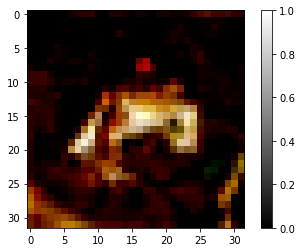

In [7]:
# 첫번째 데이터를 꺼내서 어떻게 생겼는지 확인하기
plt.imshow(train_x[0].reshape(32, 32, 3), cmap='gray')
plt.colorbar() # 오른쪽에 각 픽셀의 값과 그에 따른 색 확인
plt.show()

`Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).`

matplotib이 float인 경우 0에서 1까지의 범위를 예상하기 때문에 뜨는 오류라고 한다.   
0, 1로 정규화 후 다시 해보면 해당 문구가 더이상 출력되지 않음을 확인했다.  
-1, 1 정규화와 0, 1 정규화의 경우 어떤 차이가 있는가..?


In [8]:
train_x = train_x / 2 + 0.5 # 이미지를 [0, 1]로 정규화

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 1.0
min pixel: 0.0


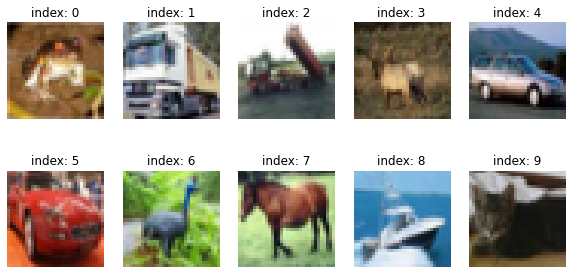

In [9]:
# for문을 활용해 10개 정도를 한번에 확인하기
plt.figure(figsize=(10, 5)) # 이미지의 크기를 결정함

for i in range(10):
    plt.subplot(2, 5, i+1) # 여러 개의 이미지를 띄우고 싶을 때 (row, col, index)의 형태로 사용
    plt.imshow(train_x[i].reshape(32, 32, 3), cmap='gray')
    plt.title(f'index: {i}') # 이미지의 제목, 여기선 라벨값을 넣어줌
    plt.axis('off') # 불필요한 축을 지움
plt.show()

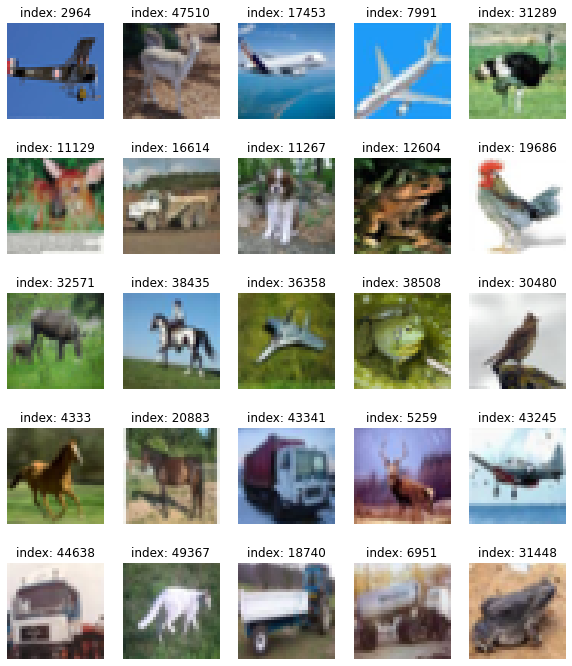

In [10]:
# 25개의 랜덤 이미지 꺼내 확인하기
plt.figure(figsize=(10, 12))

for i in range(25):
    plt.subplot(5, 5, i+1)
    random_index = np.random.randint(1, 50000)
    plt.imshow(train_x[random_index].reshape(32, 32, 3), cmap='gray')
    plt.title(f'index: {random_index}')
    plt.axis('off')

plt.show()

In [11]:
# 모델에 편하게 넣을 수 있도록 tensorflow의 Dataset을 이용해 준비해놓기
BUFFER_SIZE = 50000
BATCH_SIZE = 256 # 모델이 한번에 학습하는 데이터의 양

In [12]:
'''
tf.data.Dataset 모듈의 from_tensor_slices() 함수를 사용하면 
리스트, 넘파이, 또는 텐서플로우의 텐서 자료형에서 데이터셋을 만들 수 있습니다. 
위 코드는 train_x라는 넘파이 배열(numpy ndarray)형 자료를 섞고, 이를 배치 사이즈에 따라 나누도록 합니다. 
데이터가 잘 섞이게 하기 위해서는 버퍼 사이즈를 총 데이터 사이즈와 같거나 크게 설정하는 것이 좋습니다.
'''
train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

## 3. 생성자 모델 구현하기

* (32, 32, 3)의 shape를 가진 이미지를 생성하는 생성자 모델 구현 함수를 작성해 봅시다.
* noise = tf.random.normal([1, 100])로 생성된 랜덤 노이즈를 입력으로 하여 방금 구현한 생성자로 랜덤 이미지를 생성해 봅시다.
* 생성된 랜덤 이미지가 생성자 출력 규격에 잘 맞는지 확인해 봅시다.

In [13]:
def make_generator_model():
    
    # Start
    model = tf.keras.Sequential()

    # First: Dense layer
    # 모델은 입력값으로 batch_size, 100 형상의 노이즈 벡터를 받음
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    # 8 * 8 * 256 개의 노드를 가진 첫번째 Dense레이어를 거치며 batch_size 12544형상의 벡터가 됨
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Second: Reshape layer
    # 이후의 Layer에서 Convolutional 연산을 할 수 있도록 1차원 벡터를 8,8,256 형상의 3차원 벡터로 변환
    model.add(layers.Reshape((8, 8, 256)))

    # Third: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Fourth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(64, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Fifth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, \
                                     activation='tanh'))

    return model

In [14]:
generator = make_generator_model()

generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16384)             1638400   
                                                                 
 batch_normalization (BatchN  (None, 16384)            65536     
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 16384)             0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 128)        819200    
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 8, 8, 128)        5

In [15]:
# tf.random.normal을 이용해 가우시안 분포에서 뽑아낸 랜덤 벡터로 이루어진 노이즈 벡터를 생성
noise = tf.random.normal([1, 100])

In [16]:
'''
텐서플로우 2.0 이후 버전에서는 레이어와 모델에 call 메소드를 구현해 놓음
방금 만든 생성자 모델에 입력값으로 노이즈를 넣고 바로 모델을 호출하면 간단하게 결과 이미지가 생성됨
*학습이 아닐땐 training=False를 설정해야 함
Batch Normalization 레이어는 훈련 시기와 추론시기의 행동이 다르기 때문
'''

generated_image = generator(noise, training=False)
generated_image.shape

TensorShape([1, 32, 32, 3])

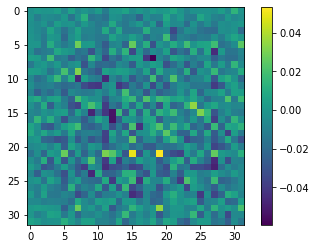

In [17]:
'''
matplotlib 라이브러리로 이미지 시각화
2차원 이미지만 보여줄 수 있으므로 0번째와 3번째 축의 인덱스를 0으로 설정 후 32, 32 shape를 꺼냄
0번째 3번째 축?
'''

plt.imshow(generated_image[0, :, :, 0])
plt.colorbar()
plt.show()

## 4. 판별자 모델 구현하기
***

* (32, 32, 3)의 이미지를 입력으로 받아 1dim을 판별결과를 출력하는 판별자 모델 구현 함수를 작성해 봅시다.
* 위 STEP 2에서 생성한 랜덤 이미지를 판별자 모델이 판별한 결과값을 확인해 봅시다.



In [18]:
def make_discriminator_model():
    
    # Start
    model = tf.keras.Sequential()

    # First: Conv2D Layer
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Second: Conv2D Layer
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Third: Flatten Layer
    model.add(layers.Flatten())

    # Fourth: Dense Layer
    model.add(layers.Dense(1))

    return model

In [19]:
# 판별 모델을 변수 생성하고 summary 출력
discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 16, 16, 64)        4864      
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 16, 16, 64)        0         
                                                                 
 dropout (Dropout)           (None, 16, 16, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 8, 8, 128)         204928    
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 dropout_1 (Dropout)         (None, 8, 8, 128)         0         
                                                                 
 flatten (Flatten)           (None, 8192)             

In [20]:
# 생성한 fake 이미지를 판별자에 입력시켜봄
decision = discriminator(generated_image, training=False)
decision

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[-0.00265618]], dtype=float32)>

## 5. 손실함수와 최적화 함수 구현하기

* 생성자와 판별자의 손실함수(loss)를 구현해 봅시다.
* 판별자의 출력값을 가지고 실제/생성(real/fake) 이미지 판별 정확도(accuracy)를 계산하는 함수를 구현해 봅시다.
* 생성자와 판별자를 최적화하는 optimizer를 정의합니다.

In [21]:
'''
tk.keras.losses의 BinaryCrossEntropy 클래스는 기본적으로 인풋값이 0-1 사이에 분포하는 확률값이라고 가정함.  
따라서 `from_logits`를 `True`로 설정해주어야 `BinaryCrossEntropy`에 입력된 함수 내부에서 
sigmoid 함수를 사용해 0~1 사이의 값으로 정규화 한 후 알맞게 계산한다.
'''

cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

### 5.1 **generator_loss**

`generator_loss`는 `fake_output`이 1에 가까워지기를 바라므로,   
다음과 같이 `tf.ones_like`와의 교차 엔트로피 값을 계산하면 된다.

즉, `cross_entropy(tf.ones_like(fake_output), fake_output)` 값은 fake_output이 1에 가까울수록 작은 값을 가진다.

In [22]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

### 5.2 **discriminator_loss**

`discriminator_loss`는 `real_output` 값은 1에 가까워지기를, `fake_output`값은 0에 가까워지기를 바라므로
두 가지 loss값을 모두 계산한다.

`real_output`은 1로 채워진 벡터와  
`fake_output`은 0으로 채워진 벡터와 비교한다.  
최종 `discriminator_loss` 값은 이 둘을 더한 값이다.

In [23]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

### 5.3 **discriminator accuracy**

판별자가 real output, fake output을 정확히 판별하는지 accuracy를 계산
특히 두 accuracy를 따로 계산해서 비교해보는 것이 매우 유용함

real accuracy와 fake accuracy는 초반에 1.0에 가깝다가 서서히낮아져서 둘 다 0.5에 가까워지는 것이 이상적

In [24]:
'''
ex) real_output = tf.Tensor([0.2,0.4,0.7,0.9]) 라면
(1) tf.math.greater_equal(real_output, tf.constant([0.5]) : real_output의 각 원소가 0.5 이상인지 True, False로 판별 - >> tf.Tensor([False, False, True, True])
(2) tf.cast( (1), tf.float32) : (1)의 결과가 True이면 1.0, False이면 0.0으로 변환 - >> tf.Tensor([0.0, 0.0, 1.0, 1.0])
(3) tf.reduce_mean( (2)) : (2)의 결과를 평균내어 이번 배치의 정확도(accuracy)를 계산 - >> 0.5
'''
def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

### 5.4 **Optimizer**

In [25]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

### 5.5 seed noise

In [26]:
# 16장의 샘플을 한번에 생성
# 생성할 샘플은 매번 같은 노이즈로 생성해야 진전 과정을 확인할 수 있으므로, 고정된 seed 노이즈를 만들어야함
# 100차원의 노이즈를 총 16개, (16,100) 형상의 벡터를 만들어 둠

noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed.shape

TensorShape([16, 100])

## 6. 훈련과정 상세 기능 구현하기
***

* 1개 미니배치의 훈련 과정을 처리하는 train_step() 함수를 구현해 봅시다.
* 16개의 고정된 seed를 입력으로 하여 훈련 과정 동안 생성한 이미지를 시각화하는 generate_and_save_images() 함수를 구현해 봅시다.
* 훈련 epoch마다 생성자/판별자의 loss 및 판별자의 실제/생성(real/fake) 이미지 판별 accuracy 히스토리(history)를 그래프로 시각화하는 draw_train_history() 함수를 구현해 봅시다.
* training_checkpoints 디렉토리에 몇 epoch마다 모델을 저장하는 checkpoint 모듈을 설정해 봅시다.

### 6.1 train_step()

In [27]:
'''
(1) 입력 데이터: Real Image 역할을 할 images 한 세트를 입력으로 받음
(2) 생성자 입력 노이즈 : generator가 FAKE IMAGE를 생성하기 위한 noise를 images 한 세트와 같은 크기인 BATCH_SIZE 만큼 생성함
(3) tf.GradientTape()는 가중치 갱신을 위한 Gradient를 자동 미분으로 계산하기 위해 with 구문 열기
(4) generated_images 생성 : generator가 noise를 입력받은 후 generated_images 생성
(5) discriminator 판별 : discriminator가 Real Image인 images와 Fake Image인 generated_images를 각각 입력받은 후 real_output, fake_output 출력
(6) loss 계산 : fake_output, real_output으로 generator와 discriminator 각각의 loss 계산
(7) accuracy 계산 : fake_output, real_output으로 discriminator의 정확도 계산
(8) gradient 계산 : gen_tape와 disc_tape를 활용해 gradient를 자동으로 계산
(9) 모델 학습 : 계산된 gradient를 optimizer에 입력해 가중치 갱신
(10) 리턴값 : 이번 스텝에 계산된 loss와 accuracy를 리턴
'''

@tf.function
def train_step(images):  #(1) 입력데이터
    noise = tf.random.normal([BATCH_SIZE, noise_dim])  #(2) 생성자 입력 노이즈

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  #(3) tf.GradientTape() 오픈
        generated_images = generator(noise, training=True)  #(4) generated_images 생성

        #(5) discriminator 판별
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        #(6) loss 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        #(7) accuracy 계산
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    #(8) gradient 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    #(9) 모델 학습
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy  #(10) 리턴값

### 6.2  generate_and_save_images()

In [28]:
# 위에서 만든 고정된 seed를 이용해 결과물을 만드므로, 결과물이 얼마나 나아지고 있는지 확인 가능eds):

def generate_and_save_images(model, epoch, it, sample_seeds):
    
    predictions = model(sample_seeds, training=False)

    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((predictions[i]+1)/2.0)
        plt.axis('off')
   
    plt.savefig('D:/project/aiffel_exp/exp10_GAN/cifar-10/generated_samples2/sample_epoch_{:04d}_iter_{:03d}.png'
                    .format(epoch, it))

    plt.show()

line 10  `plt.imshow(predictions[i, :, :, 0], cmap='gray')` 를 수정했다.  
`[i, :, :, 0]` -> `[i]`로  
`cmap='gray'` -> 삭제

### 6.3 draw_train_history()

In [29]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6    # matlab 차트의 기본 크기를 15,6으로 지정해 줍니다.

def draw_train_history(history, epoch):
    # summarize history for loss  
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    # summarize history for accuracy  
    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장합니다.
    plt.savefig('D:/project/aiffel_exp/exp10_GAN/cifar-10/training_history2/train_history_{:04d}.png'
                    .format(epoch))
    plt.show()

### 6.4 checkpoint module

In [30]:
checkpoint_dir = 'D:/project/aiffel_exp/exp10_GAN/cifar-10/training_checkpoints2'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## 7. 학습 과정 진행하기
***

* 위 STEP 5에서 구현한 기능들을 활용하여 최소 50 epoch만큼의 모델 학습을 진행해 봅시다.
* 학습 과정에서 생성된 샘플 이미지로 만든 gif 파일을 통해 학습 진행 과정을 시각적으로 표현해 봅시다.
* 학습 과정을 담은 샘플 이미지, gif 파일, 학습 진행 그래프 이미지를 함께 제출합니다.

### 7.1 모델학습 진행

In [31]:
def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 50 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch)

In [32]:
save_every = 5 # 모델 저장 간격 설정
EPOCHS = 50

# 사용가능한 GPU 디바이스 확인
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

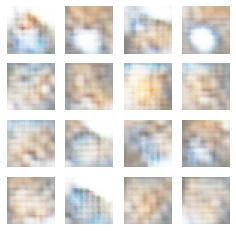

Time for training : 865 sec


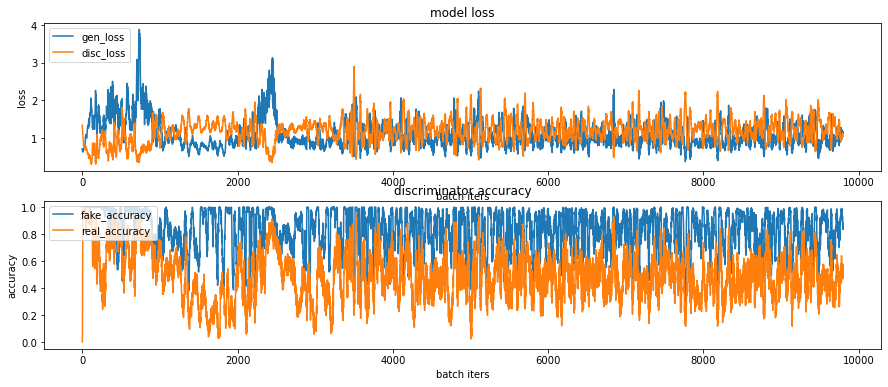

Wall time: 14min 26s


In [33]:
%%time
train(train_dataset, EPOCHS, save_every)

# 학습과정의 loss, accuracy 그래프 이미지 파일이 ~/aiffel/dcgan_newimage/fashion/training_history 경로에 생성되고 있으니
# 진행 과정을 수시로 확인해 보시길 권합니다.

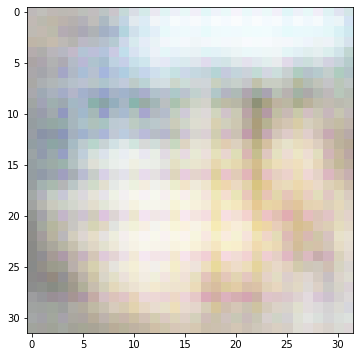

In [34]:
checkpoint_dir = 'D:/project/aiffel_exp/exp10_GAN/cifar-10/training_checkpoints2'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
# plt.imshow(np_generated[0]) 
plt.imshow((generated_image[0] +1.0) / 2.0)
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

### 7.2 학습과정 시각화

In [58]:
anim_file = 'D:/project/aiffel_exp/exp10_GAN/cifar-10/gif/fashion_mnist_dcgan1000.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('D:/project/aiffel_exp/exp10_GAN/cifar-10/generated_samples2/sample*.png')
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

In [59]:
anim_file2 = 'D:/project/aiffel_exp/exp10_GAN/cifar-10/gif/training_history_dcgan1000.gif'

with imageio.get_writer(anim_file2, mode='I') as writer:
    filenames = glob.glob('D:/project/aiffel_exp/exp10_GAN/cifar-10/training_history2/train*.png')
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

## 8. (optional) GAN 훈련 과정 개선하기
***
* STEP 6을 진행하면서 생성된 샘플 이미지, 학습 과정 그래프 등을 통해 이전 훈련 과정의 문제점을 분석해 봅시다.
* 모델구조 또는 학습 과정을 개선한 내역과 그 결과(샘플 이미지, 학습 과정 그래프 포함)를 함께 제출합니다.

확인해볼만한 사항들

1. **learning rate** -> generator의 lr을 1e-4에서 1e-5으로 변경 / discriminator의 lr을 1e-4에서 2e-4로 변경
2. 손실 함수 -> 변경하지 않음
3. 데이터 정규화 -> 0, 1 범위로 이미 적용됨
4. 활성화 함수 -> LeakyReLU 이미 적용됨
5. Batch normalization -> 이미 적용됨
6. **epoch 횟수** -> 200, 300, 400씩 추가 적용하면서 학습 상태를 확인

### 8.1 learning rate 변경

In [37]:
generator_optimizer = tf.keras.optimizers.Adam(1e-5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4)

### 8.2 epoch 150 (100회 추가)

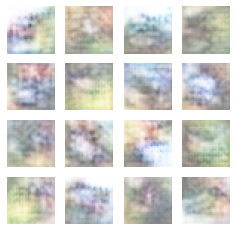

Time for training : 1712 sec


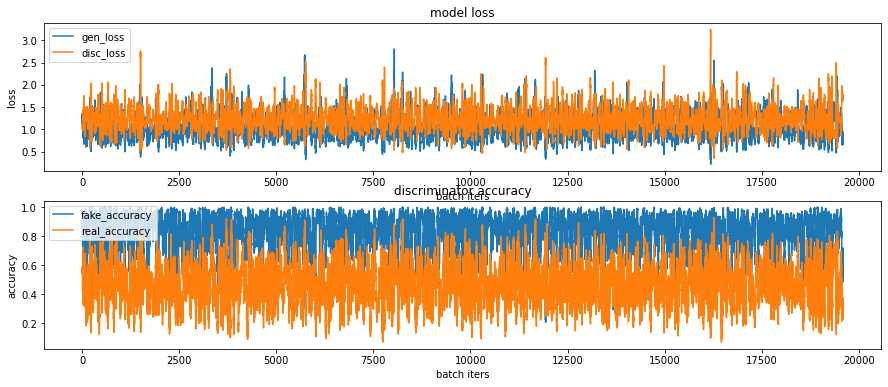

In [38]:
EPOCHS = 100
train(train_dataset, EPOCHS, save_every)

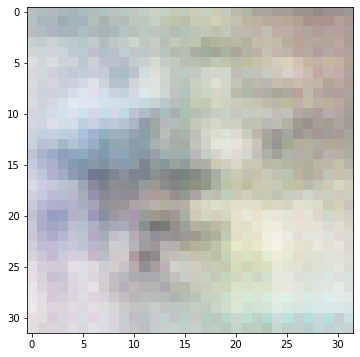

In [44]:
checkpoint_dir = 'D:/project/aiffel_exp/exp10_GAN/cifar-10/training_checkpoints2'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
# plt.imshow(np_generated[0]) 
plt.imshow((generated_image[0] +1.0) / 2.0)
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

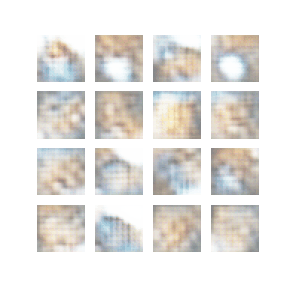

In [43]:
display.Image(filename="D:/project/aiffel_exp/exp10_GAN/cifar-10/gif/fashion_mnist_dcgan150.gif.png")

### 8.3 epoch 350 (200회 추가)

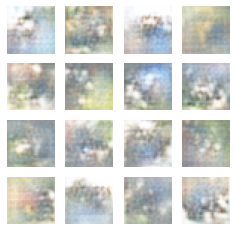

Time for training : 3317 sec


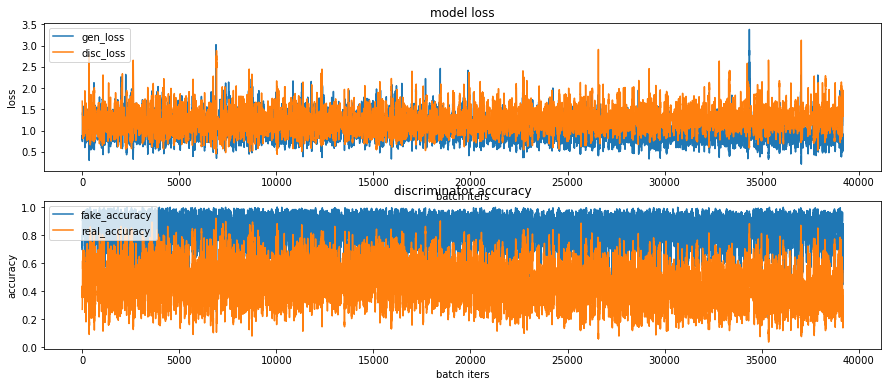

In [45]:
EPOCHS = 200
train(train_dataset, EPOCHS, save_every)

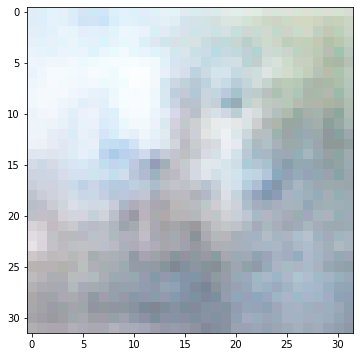

In [50]:
checkpoint_dir = 'D:/project/aiffel_exp/exp10_GAN/cifar-10/training_checkpoints2'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
# plt.imshow(np_generated[0]) 
plt.imshow((generated_image[0] +1.0) / 2.0)
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

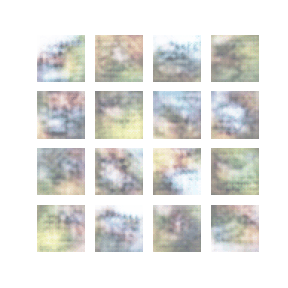

In [49]:
display.Image(filename="D:/project/aiffel_exp/exp10_GAN/cifar-10/gif/fashion_mnist_dcgan350.gif.png")

### epoch 650 (300회 추가)

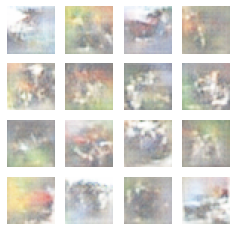

Time for training : 5358 sec


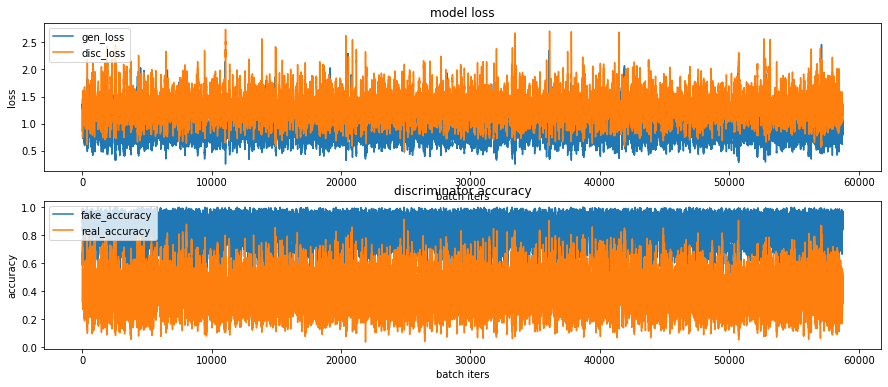

In [51]:
EPOCHS = 300
train(train_dataset, EPOCHS, save_every)

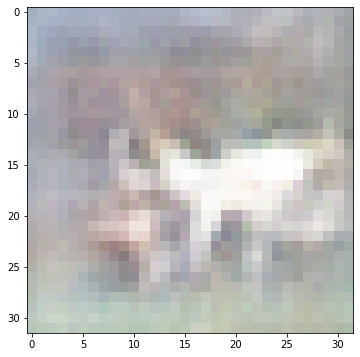

In [52]:
checkpoint_dir = 'D:/project/aiffel_exp/exp10_GAN/cifar-10/training_checkpoints2'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
# plt.imshow(np_generated[0]) 
plt.imshow((generated_image[0] +1.0) / 2.0)
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

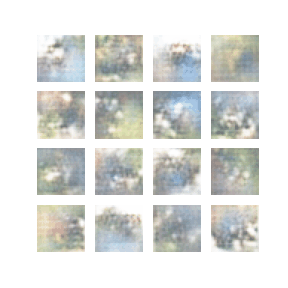

In [55]:
display.Image(filename="D:/project/aiffel_exp/exp10_GAN/cifar-10/gif/fashion_mnist_dcgan650.gif.png")

에포크 650이 넘어가자 뭔가 명확한 실루엣이 보이기 시작한다.  
원래는 epoch 횟수를 50, 150, 350, 650으로 끝내려했으나 실루엣이 보여서 350을 한 번 더 추가했다.

### epoch 1000 (350회 추가)

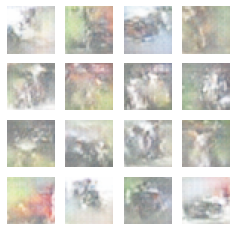

Time for training : 5670 sec


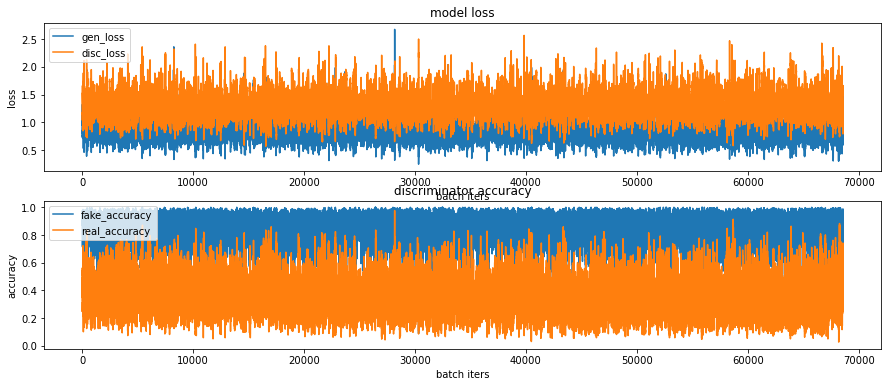

In [56]:
EPOCHS = 350
train(train_dataset, EPOCHS, save_every)

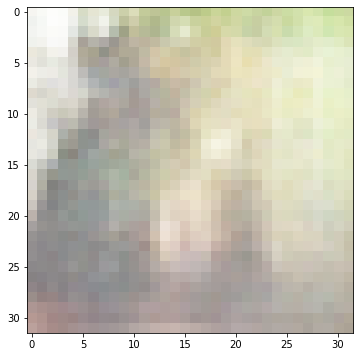

In [57]:
checkpoint_dir = 'D:/project/aiffel_exp/exp10_GAN/cifar-10/training_checkpoints2'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
# plt.imshow(np_generated[0]) 
plt.imshow((generated_image[0] +1.0) / 2.0)
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

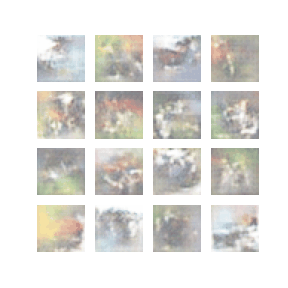

In [60]:
display.Image(filename="D:/project/aiffel_exp/exp10_GAN/cifar-10/gif/fashion_mnist_dcgan1000.gif.png")

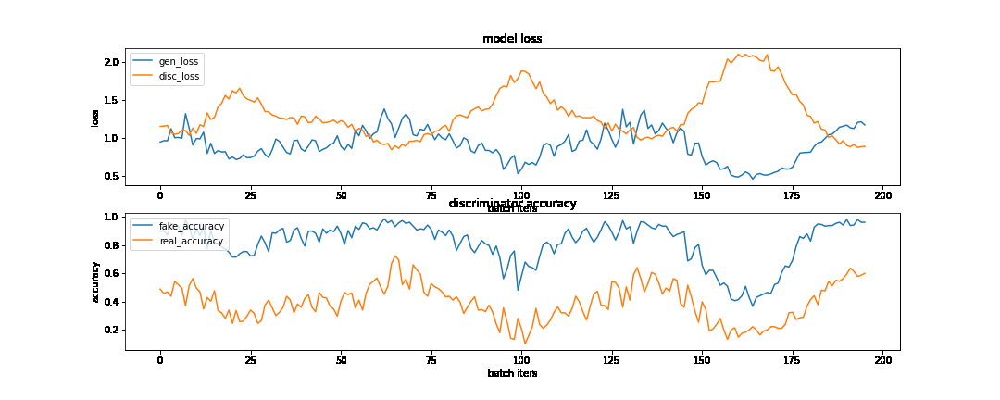

In [61]:
display.Image(filename="D:/project/aiffel_exp/exp10_GAN/cifar-10/gif/training_history_dcgan1000.gif.png")

## 9. 느낀점

* 이미지를 생성하는 모델의 개념과 그 과정을 해보는게 신기했다.
* 모델이 결과물 출력 이후 더 나은 방향으로 스스로 개선하는 과정이 궁금했는데, 생성자와 판별자로 이해할 수 있었다.
* 프로젝트 실습을 진행하면서 epoch 2천회를 잘 때 돌려놨으나 주피터노트북 저장을 실수하여 처음부터 다시 진행했다..
* epoch를 추가할수록 이미지가 개선되는게 보여 명확한 output이 나올떄까지 진행해보고 싶었으나 시간이 부족해서 아쉽다.
* epoch 횟수가 늘어날수록, 자동으로 세팅해둔 이미지 저장과 모델 저장 데이터가 상당한 양의 용량을 차지하는 걸 확인했다. 현업에선 이런 이슈를 어떻게 처리 혹은 대비하는지 궁금해졌다.
* loss와 accuracy의 시각화된 그래프를 통해 모델의 성능을 파악하는게 어려웠다.